# 1

# 2

# 3

# 4

# Momentum-Based/Trend-Following Strategies

## Rolling Window Mean Strategy

This strategy is to own a financial asset if its latest stock price is above the average price
over the last X days.
In the following example, it works well for Apple stock and a period of 90 days:

In [1]:
import pandas as pd
pd.set_option('display.max_columns', 500)
pd.set_option('display.max_rows', 500)

In [2]:
import zipline.data.bundles as bdl
print(bdl.__path__)

['C:\\Users\\avi\\anaconda3\\envs\\env_zipline\\lib\\site-packages\\zipline\\data\\bundles']


In [3]:
import os
os.getcwd()

'C:\\Users\\avi\\Possible_Project\\Hands_on_Python_for_Trading\\Hands-On-Financial-Trading-with-Python\\Chapter09'

In [4]:
import pandas_datareader.data as web
start = pd.Timestamp('2015')
end = pd.Timestamp('2020')

sp500 = web.DataReader('SP500', 'fred', start, end)

In [5]:
benchmark_returns = sp500.pct_change()

C:\Users\avi\AppData\Local\Temp\tmp2mcovswo\ipykernel_8404\2707357258.py:1: FutureWarning: The default fill_method='pad' in DataFrame.pct_change is deprecated and will be removed in a future version. Either fill in any non-leading NA values prior to calling pct_change or specify 'fill_method=None' to not fill NA values.
  benchmark_returns = sp500.pct_change()


In [32]:
sp500

,SP500
DATE,
2015-02-27,2104.50
2015-03-02,2117.39
2015-03-03,2107.78
2015-03-04,2098.53
2015-03-05,2101.04
...,...
2019-12-26,3239.91
2019-12-27,3240.02
2019-12-30,3221.29


In [6]:
import yfinance as yf
df_demo = yf.download('SP500',start, end,  multi_level_index=False, )
df_demo.head(100)

YF.download() has changed argument auto_adjust default to True


[*********************100%***********************]  1 of 1 completed

1 Failed download:
['SP500']: YFTzMissingError('possibly delisted; no timezone found')


,Adj Close,Close,High,Low,Open,Volume
Date,,,,,,


Timestamp('2015-01-01 00:00:00')

Start date,2016-01-04
End date,2017-12-29
Total months,23
,Backtest
Annual return,13.9%
Cumulative returns,29.6%
Annual volatility,14.5%
Sharpe ratio,0.97
Calmar ratio,1.26
Stability,0.86
Max drawdown,-11.0%


Worst drawdown periods,Net drawdown in %,Peak date,Valley date,Recovery date,Duration
0,11.02,2016-01-26,2016-02-23,2016-03-29,46
1,9.86,2017-05-12,2017-06-27,2017-11-09,130
2,6.43,2016-04-04,2016-05-17,2016-05-26,39
3,6.31,2017-11-09,2017-11-29,NaT,NaN
4,5.43,2016-08-15,2016-09-14,2017-01-11,108


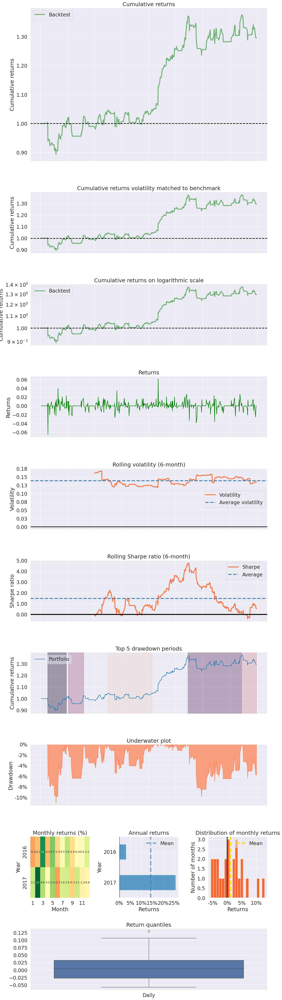

In [10]:
%matplotlib inline

from zipline import run_algorithm 

from zipline.api import order_target_percent, symbol, set_commission, set_slippage
from zipline.finance.commission import PerTrade
from zipline.finance.slippage import EquitySlippageModel, VolumeShareSlippage
import pyfolio as pf

import warnings
warnings.filterwarnings('ignore')

import numpy as np
np.NINF=  np.inf
pd.Series.iteritems = pd.Series.items
# pd.to_pydatetime = pd.to_datetime

def initialize(context): 
    context.stock = symbol('AAPL')
    context.rolling_window = 10
    set_commission(PerTrade(cost=5)) 
    set_slippage(VolumeShareSlippage(volume_limit=0.025, price_impact=0.1))


def handle_data(context, data): 
    price_hist = data.history(context.stock, "close", context.rolling_window, "1d")           
    #print(price_hist) #this collects price history for rolling window length to compute mean
    order_target_percent(context.stock, 1.0 if price_hist[-1] > price_hist.mean() else 0.0) #only have capital_base and can buy accordingly ,
    #if price rises beyond mean we buy given the capital allows, esle sell

def analyze(context, perf): 
    returns, positions, transactions = pf.utils.extract_rets_pos_txn_from_zipline(perf) 
    #pf.create_returns_tear_sheet(returns, benchmark_rets = )
    pf.create_returns_tear_sheet(returns, benchmark_rets = None)
    
# start_date = pd.to_datetime('2000-1-1', utc=True)
# end_date = pd.to_datetime('2018-1-1', utc=True)
start_date = pd.Timestamp('2016-1-1')
end_date = pd.Timestamp('2018-1-1')

    
results = run_algorithm(start = start_date, end = end_date, initialize = initialize,  
                        handle_data = handle_data, analyze = analyze, capital_base = 10000, 
                        data_frequency = 'daily', bundle ='quandl')


In [10]:
results[:300] #if you remove analyze = analyze, in run_algorithm

,period_open,period_close,ending_value,starting_value,shorts_count,pnl,long_exposure,ending_exposure,net_leverage,positions,gross_leverage,transactions,capital_used,long_value,short_exposure,orders,longs_count,starting_exposure,starting_cash,portfolio_value,short_value,ending_cash,returns,max_leverage,benchmark_period_return,benchmark_volatility,treasury_period_return,sortino,alpha,beta,sharpe,period_label,trading_days,algo_volatility,excess_return,max_drawdown,algorithm_period_return
2000-01-03 21:00:00+00:00,2000-01-03 14:31:00+00:00,2000-01-03 21:00:00+00:00,0.00,0.00,0,0.000000,0.00,0.00,0.000000,[],0.000000,[],0.000000,0.00,0.0,"[{'id': 'bd549a95942b465d89542f9c920cbde1', 'd...",0,0.00,10000.000000,10000.000000,0.0,10000.000000,0.000000,0.000000,0.0,NaN,0.0,NaN,None,None,NaN,2000-01,1,NaN,0.0,0.000000,0.000000
2000-01-04 21:00:00+00:00,2000-01-04 14:31:00+00:00,2000-01-04 21:00:00+00:00,9122.50,0.00,0,-9.561250,9122.50,9122.50,0.913123,"[{'sid': Equity(8 [AAPL]), 'amount': 89, 'cost...",0.913123,"[{'amount': 89, 'dt': 2000-01-04 21:00:00+00:0...",-9132.061250,9122.50,0.0,"[{'id': 'bd549a95942b465d89542f9c920cbde1', 'd...",1,0.00,10000.000000,9990.438750,0.0,867.938750,-0.000956,0.913123,0.0,0.0,0.0,-11.224972,None,None,-11.224972,2000-01,2,0.010732,0.0,-0.000956,-0.000956
2000-01-05 21:00:00+00:00,2000-01-05 14:31:00+00:00,2000-01-05 21:00:00+00:00,10088.00,9122.50,0,128.084000,10088.00,10088.00,0.996983,"[{'sid': Equity(8 [AAPL]), 'amount': 97, 'cost...",0.996983,"[{'amount': 8, 'dt': 2000-01-05 21:00:00+00:00...",-837.416000,10088.00,0.0,"[{'id': '7079bdee70534007ba8ec97cd7b280c9', 'd...",1,9122.50,867.938750,10118.522750,0.0,30.522750,0.012821,0.996983,0.0,0.0,0.0,113.730153,None,None,8.160941,2000-01,3,0.122121,0.0,-0.000956,0.011852
2000-01-06 21:00:00+00:00,2000-01-06 14:31:00+00:00,2000-01-06 21:00:00+00:00,9215.00,10088.00,0,-873.000000,9215.00,9215.00,0.996699,"[{'sid': Equity(8 [AAPL]), 'amount': 97, 'cost...",0.996699,[],0.000000,9215.00,0.0,"[{'id': 'd4074f26d6724317a42667f1ee769d4b', 'd...",1,10088.00,30.522750,9245.522750,0.0,30.522750,-0.086277,0.996983,0.0,0.0,0.0,-6.845333,None,None,-6.483177,2000-01,4,0.723104,0.0,-0.086277,-0.075448
2000-01-07 21:00:00+00:00,2000-01-07 14:31:00+00:00,2000-01-07 21:00:00+00:00,0.00,9215.00,0,426.674250,0.00,0.00,0.000000,[],0.000000,"[{'amount': -97, 'dt': 2000-01-07 21:00:00+00:...",9641.674250,0.00,0.0,"[{'id': 'd4074f26d6724317a42667f1ee769d4b', 'd...",0,9215.00,30.522750,9672.197000,0.0,9672.197000,0.046149,0.996983,0.0,0.0,0.0,-2.325514,None,None,-1.833691,2000-01,5,0.776841,0.0,-0.086277,-0.032780
2000-01-10 21:00:00+00:00,2000-01-10 14:31:00+00:00,2000-01-10 21:00:00+00:00,0.00,0.00,0,0.000000,0.00,0.00,0.000000,[],0.000000,[],0.000000,0.00,0.0,[],0,0.00,9672.197000,9672.197000,0.0,9672.197000,0.000000,0.996983,0.0,0.0,0.0,-2.122894,None,None,-1.706071,2000-01,6,0.695792,0.0,-0.086277,-0.032780
2000-01-11 21:00:00+00:00,2000-01-11 14:31:00+00:00,2000-01-11 21:00:00+00:00,0.00,0.00,0,0.000000,0.00,0.00,0.000000,[],0.000000,[],0.000000,0.00,0.0,[],0,0.00,9672.197000,9672.197000,0.0,9672.197000,0.000000,0.996983,0.0,0.0,0.0,-1.965418,None,None,-1.600337,2000-01,7,0.635797,0.0,-0.086277,-0.032780
2000-01-12 21:00:00+00:00,2000-01-12 14:31:00+00:00,2000-01-12 21:00:00+00:00,0.00,0.00,0,0.000000,0.00,0.00,0.000000,[],0.000000,[],0.000000,0.00,0.0,[],0,0.00,9672.197000,9672.197000,0.0,9672.197000,0.000000,0.996983,0.0,0.0,0.0,-1.838480,None,None,-1.511372,2000-01,8,0.589070,0.0,-0.086277,-0.032780
2000-01-13 21:00:00+00:00,2000-01-13 14:31:00+00:00,2000-01-13 21:00:00+00:00,0.00,0.00,0,0.000000,0.00,0.00,0.000000,[],0.000000,[],0.000000,0.00,0.0,[],0,0.00,9672.197000,9672.197000,0.0,9672.197000,0.000000,0.996983,0.0,0.0,0.0,-1.733336,None,None,-1.435373,2000-01,9,0.551341,0.0,-0.086277,-0.032780
2000-01-14 21:00:00+00:00,2000-01-14 14:31:00+00:00,2000-01-14 21:00:00+00:00,0.00,0.00,0,0.000000,0.00,0.00,0.000000,[],0.000000,[],0.000000,0.00,0.0,"[{'id': '5b60e9821e334750b

In [3]:
# results.to_csv('Rolling_window_mean_strategy.xlsx')


In [4]:
# import os
# os.getcwd()

In [5]:
# results['transactions'][1:300]

## Simple Moving Averages Strategy

Start date,2016-01-04
End date,2017-12-29
Total months,23
,Backtest
Annual return,15.5%
Cumulative returns,33.4%
Annual volatility,16.8%
Sharpe ratio,0.94
Calmar ratio,0.73
Stability,0.73
Max drawdown,-21.2%


Worst drawdown periods,Net drawdown in %,Peak date,Valley date,Recovery date,Duration
0,21.17,2016-01-04,2016-05-12,2017-02-01,283
1,8.88,2017-05-12,2017-06-16,2017-08-02,59
2,8.25,2017-09-01,2017-09-25,2017-10-30,42
3,4.08,2017-12-18,2017-12-29,NaT,NaN
4,3.91,2017-11-09,2017-12-06,2017-12-18,28


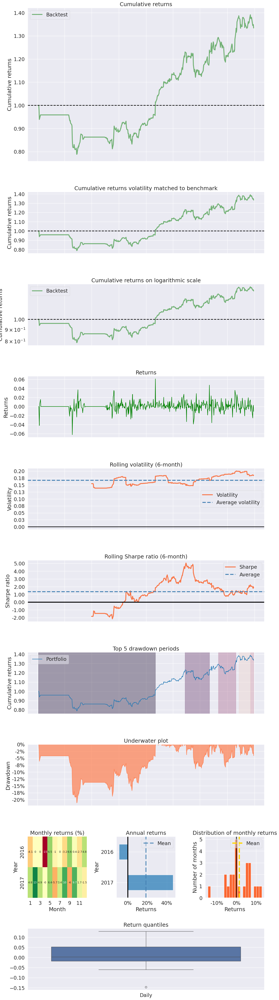

In [9]:
%matplotlib inline

from zipline import run_algorithm 

from zipline.api import order_target_percent, symbol, set_commission, set_slippage
from zipline.finance.commission import PerTrade
from zipline.finance.slippage import EquitySlippageModel, VolumeShareSlippage
import pandas as pd
import pyfolio as pf

import warnings
warnings.filterwarnings('ignore')

def initialize(context): 
    context.stock = symbol('AAPL')
    context.rolling_window = 90 
    set_commission(PerTrade(cost=5))  
    set_slippage(VolumeShareSlippage(volume_limit=0.025, price_impact=0.1))

def handle_data(context, data): 
    price_hist = data.history(context.stock, "close", context.rolling_window, "1d")          
    
    rolling_mean_short_term = price_hist.rolling(window=45, center=False).mean()
    rolling_mean_long_term = price_hist.rolling(window=90, center=False).mean()
    
    if rolling_mean_short_term[-1] > rolling_mean_long_term[-1]:
        order_target_percent(context.stock, 1.0)     
    elif rolling_mean_short_term[-1] < rolling_mean_long_term[-1]:
        order_target_percent(context.stock, 0.0)     

def analyze(context, perf): 
    returns, positions, transactions = pf.utils.extract_rets_pos_txn_from_zipline(perf) 
    pf.create_returns_tear_sheet(returns, benchmark_rets = None)
    
# start_date = pd.to_datetime('2000-1-1', utc=True)
# end_date = pd.to_datetime('2018-1-1', utc=True)
start_date = pd.Timestamp('2016-1-1')
end_date = pd.Timestamp('2018-1-1')
    
results = run_algorithm(start = start_date, end = end_date, initialize = initialize,\
                        analyze = analyze, handle_data = handle_data, capital_base = 10000, \
                        data_frequency = 'daily', bundle ='quandl')

## Exponentially-Weighted Moving Averages Strategy

Start date,2016-01-04
End date,2017-12-29
Total months,23
,Backtest
Annual return,22.6%
Cumulative returns,50.1%
Annual volatility,15.1%
Sharpe ratio,1.42
Calmar ratio,2.35
Stability,0.90
Max drawdown,-9.6%


Worst drawdown periods,Net drawdown in %,Peak date,Valley date,Recovery date,Duration
0,9.59,2016-04-14,2016-07-26,2016-08-05,82
1,8.85,2017-09-01,2017-10-19,2017-11-03,46
2,7.51,2016-10-25,2016-12-12,2017-02-01,72
3,6.87,2017-05-12,2017-06-12,2017-08-08,63
4,5.75,2016-08-15,2016-09-09,2016-10-11,42


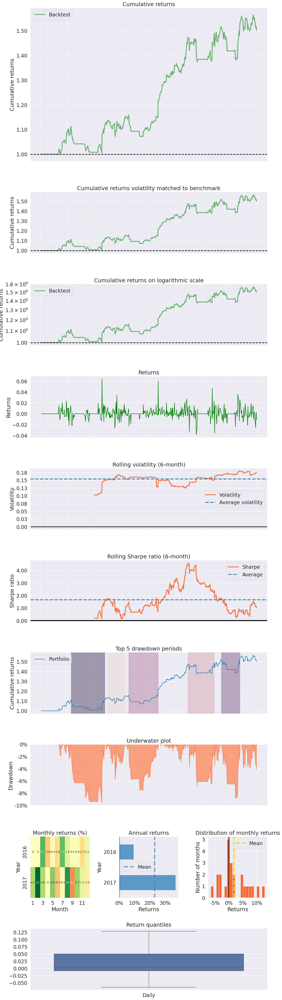

In [12]:
%matplotlib inline

from zipline import run_algorithm 
from zipline.api import order_target_percent, symbol, set_commission, set_slippage
from zipline.finance.commission import PerTrade
from zipline.finance.slippage import EquitySlippageModel, VolumeShareSlippage
import pandas as pd
import pyfolio as pf

import warnings
warnings.filterwarnings('ignore')

def initialize(context): 
    context.stock = symbol('AAPL')
    context.rolling_window = 90
    set_commission(PerTrade(cost=5))   
    set_slippage(VolumeShareSlippage(volume_limit=0.025, price_impact=0.1))

def handle_data(context, data): 
    price_hist = data.history(context.stock, "close", context.rolling_window, "1d")          
    
    rolling_mean_short_term = price_hist.ewm(span=5,adjust=True,ignore_na=True).mean()
    rolling_mean_long_term = price_hist.ewm(span=30,adjust=True,ignore_na=True).mean()
    
    if rolling_mean_short_term[-1] > rolling_mean_long_term[-1]:
        order_target_percent(context.stock, 1.0)     
    elif rolling_mean_short_term[-1] < rolling_mean_long_term[-1]:
        order_target_percent(context.stock, 0.0)     

def analyze(context, perf): 
    returns, positions, transactions = pf.utils.extract_rets_pos_txn_from_zipline(perf) 
    pf.create_returns_tear_sheet(returns, benchmark_rets = None)
    
# start_date = pd.to_datetime('2000-1-1', utc=True)
# end_date = pd.to_datetime('2018-1-1', utc=True)
start_date = pd.Timestamp('2016-1-1')
end_date = pd.Timestamp('2018-1-1')
    
results = run_algorithm(start = start_date, end = end_date, initialize = initialize,\
                        analyze = analyze, handle_data = handle_data, capital_base = 10000, \
                        data_frequency = 'daily', bundle ='quandl')

## RSI Strategy

In [2]:
# from stockstats import StockDataFrame as sdf

#StockDataFrame works as a wrapper for the pandas.DataFrame. 
#You need to Initialize the StockDataFrame with wrap or StockDataFrame.retype

# '''Supply a wrapper StockDataFrame for pandas.DataFrame with inline stock statistics/indicators support.

# Supported statistics/indicators are:

#     delta
#     permutation (zero-based)
#     log return
#     max in range
#     min in range
#     middle = (close + high + low) / 3
#     compare: le, ge, lt, gt, eq, ne
#     count: both backward(c) and forward(fc)
#     cross: including upward cross and downward cross
#     SMA: Simple Moving Average
#     EMA: Exponential Moving Average
#     MSTD: Moving Standard Deviation
#     MVAR: Moving Variance
#     RSV: Raw Stochastic Value
#     RSI: Relative Strength Index
#     KDJ: Stochastic Oscillator
#     Bolling: Bollinger Band
#     MACD: Moving Average Convergence Divergence
#     CR: Energy Index (Intermediate Willingness Index)
#     WR: Williams Overbought/Oversold index
#     CCI: Commodity Channel Index
#     TR: True Range
#     ATR: Average True Range
#     DMA: Different of Moving Average (10, 50)
#     DMI: Directional Moving Index, including
#         +DI: Positive Directional Indicator
#         -DI: Negative Directional Indicator
#         ADX: Average Directional Movement Index
#         ADXR: Smoothed Moving Average of ADX
#     TRIX: Triple Exponential Moving Average
#     TEMA: Another Triple Exponential Moving Average
#     VR: Volume Variation Index
#     MFI: Money Flow Index
#     VWMA: Volume Weighted Moving Average
#     CHOP: Choppiness Index
#     KER: Kaufman's efficiency ratio
#     KAMA: Kaufman's Adaptive Moving Average
#     PPO: Percentage Price Oscillator
#     StochRSI: Stochastic RSI
#     WT: LazyBear's Wave Trend
#     Supertrend: with the Upper Band and Lower Band
#     Aroon: Aroon Oscillator
#     Z: Z-Score
#     AO: Awesome Oscillator
#     BOP: Balance of Power
#     MAD: Mean Absolute Deviation
#     ROC: Rate of Change
#     Coppock: Coppock Curve
#     Ichimoku: Ichimoku Cloud
#     CTI: Correlation Trend Indicator
#     LRMA: Linear Regression Moving Average
#     ERI: Elder-Ray Index
#     FTR: the Gaussian Fisher Transform Price Reversals indicator
#     RVGI: Relative Vigor Index
#     Inertia: Inertia Indicator
#     KST: Know Sure Thing
#     PGO: Pretty Good Oscillator
#     PSL: Psychological Line
#     PVO: Percentage Volume Oscillator
#     QQE: Quantitative Qualitative Estimation
# '''

Start date,2016-01-04
End date,2017-12-29
Total months,23
,Backtest
Annual return,17.0%
Cumulative returns,36.9%
Annual volatility,12.1%
Sharpe ratio,1.36
Calmar ratio,1.62
Stability,0.86
Max drawdown,-10.5%


Worst drawdown periods,Net drawdown in %,Peak date,Valley date,Recovery date,Duration
0,10.55,2016-10-25,2016-11-14,2017-01-09,55
1,8.28,2016-05-26,2016-06-27,2016-07-27,45
2,5.77,2016-08-15,2016-09-09,2016-09-14,23
3,5.05,2016-05-03,2016-05-12,2016-05-20,14
4,2.92,2016-09-15,2016-09-29,2016-10-10,18


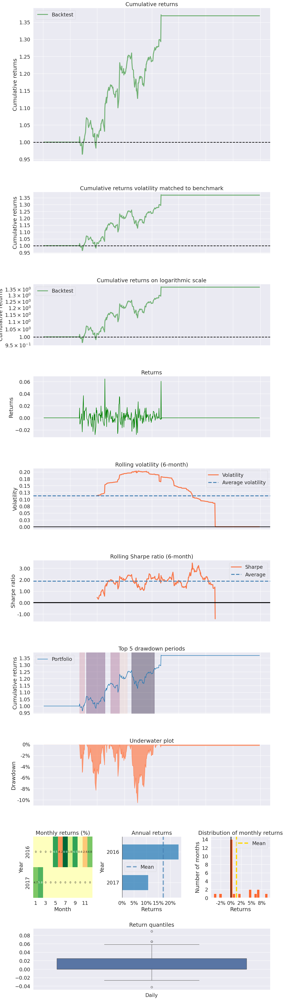

In [17]:
%matplotlib inline

from zipline import run_algorithm 
from zipline.api import order_target_percent, symbol, set_commission, set_slippage
from zipline.finance.commission import PerTrade
from zipline.finance.slippage import EquitySlippageModel, VolumeShareSlippage
import pandas as pd
import pyfolio as pf
from stockstats import StockDataFrame as sdf

import warnings
warnings.filterwarnings('ignore')

def initialize(context): 
    context.stock = symbol('AAPL')
    context.rolling_window = 20
    set_commission(PerTrade(cost=5))  
    set_slippage(VolumeShareSlippage(volume_limit=0.025, price_impact=0.1))

def handle_data(context, data): 
    price_hist = data.history(context.stock, ["open", "high", "low","close"], context.rolling_window, "1d")             
    
    stock=sdf.retype(price_hist)  

    rsi = stock.get('rsi_12') #12 period RSI
    
    if rsi[-1] > 90: #overbought
        order_target_percent(context.stock, 0.0)     
    elif rsi[-1] < 10: #oversold
        order_target_percent(context.stock, 1.0)   
        
def analyze(context, perf): 
    returns, positions, transactions = pf.utils.extract_rets_pos_txn_from_zipline(perf) 
    pf.create_returns_tear_sheet(returns, benchmark_rets = None)
    
# start_date = pd.to_datetime('2015-1-1', utc=True)
# end_date = pd.to_datetime('2018-1-1', utc=True)
start_date = pd.Timestamp('2016-1-1')
end_date = pd.Timestamp('2018-1-1')
    
# results = run_algorithm(start = start_date, end = end_date, initialize = initialize, \
#                         analyze = analyze, handle_data = handle_data, capital_base = 10000, \ 
#                         data_frequency = 'daily', bundle ='quandl')

results = run_algorithm(start = start_date, end = end_date, initialize = initialize,\
                        analyze = analyze, handle_data = handle_data, capital_base = 10000, \
                        data_frequency = 'daily', bundle ='quandl')

## MACD Crossover Strategy

Start date,2016-01-04
End date,2017-12-29
Total months,23
,Backtest
Annual return,17.6%
Cumulative returns,38.3%
Annual volatility,14.0%
Sharpe ratio,1.23
Calmar ratio,1.92
Stability,0.88
Max drawdown,-9.2%


Worst drawdown periods,Net drawdown in %,Peak date,Valley date,Recovery date,Duration
0,9.16,2016-01-26,2016-02-23,2016-03-15,36
1,8.05,2016-08-15,2016-12-12,2017-02-01,123
2,6.99,2017-05-12,2017-06-29,2017-10-16,112
3,5.11,2016-04-14,2016-05-19,2016-05-25,30
4,3.93,2017-11-09,2017-11-15,NaT,NaN


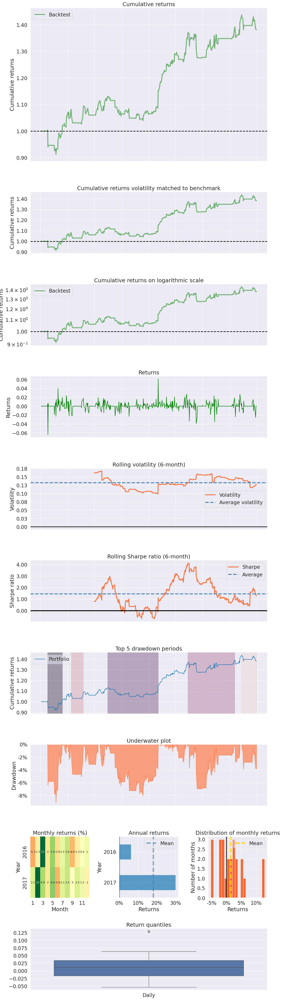

In [18]:
%matplotlib inline

from zipline import run_algorithm 
from zipline.api import order_target_percent, symbol, set_commission, set_slippage
from zipline.finance.commission import PerTrade
from zipline.finance.slippage import EquitySlippageModel, VolumeShareSlippage
import pandas as pd
import pyfolio as pf
from stockstats import StockDataFrame as sdf

import warnings
warnings.filterwarnings('ignore')

def initialize(context): 
    context.stock = symbol('AAPL')
    context.rolling_window = 20
    set_commission(PerTrade(cost=5))     
    set_slippage(VolumeShareSlippage(volume_limit=0.025, price_impact=0.1))

def handle_data(context, data): 
    price_hist = data.history(context.stock, ["open", "high", "low","close"], context.rolling_window, "1d")             
    
    stock=sdf.retype(price_hist)   

    signal = stock['macds'] #signal line
    macd   = stock['macd'] #macd line
    
    if macd[-1] > signal[-1] and macd[-2] <= signal[-2]: #macd crossing over above signal line, indicating uptrend 
        order_target_percent(context.stock, 1.0)     
    elif macd[-1] < signal[-1] and macd[-2] >= signal[-2]: #macd crossing over below signal line, indicating uptrend 
        order_target_percent(context.stock, 0.0)   
        
def analyze(context, perf): 
    returns, positions, transactions = pf.utils.extract_rets_pos_txn_from_zipline(perf) 
    pf.create_returns_tear_sheet(returns, benchmark_rets = None)
    
# start_date = pd.to_datetime('2015-1-1', utc=True)
# end_date = pd.to_datetime('2018-1-1', utc=True)
start_date = pd.Timestamp('2016-1-1')
end_date = pd.Timestamp('2018-1-1')
    
results = run_algorithm(start = start_date, end = end_date, initialize = initialize, \
                        analyze = analyze, handle_data = handle_data, capital_base = 10000, \
                        data_frequency = 'daily', bundle ='quandl')

## RSI + MACD Strategy

Start date,2016-01-04
End date,2017-12-29
Total months,23
,Backtest
Annual return,9.8%
Cumulative returns,20.6%
Annual volatility,11.8%
Sharpe ratio,0.86
Calmar ratio,0.95
Stability,0.65
Max drawdown,-10.3%


Worst drawdown periods,Net drawdown in %,Peak date,Valley date,Recovery date,Duration
0,10.34,2016-01-29,2016-02-09,2016-03-31,45
1,8.62,2016-05-31,2016-06-27,2016-07-12,31
2,4.27,2016-04-01,2016-05-23,2016-05-27,41
3,3.98,2017-01-27,2017-02-02,NaT,NaN
4,1.61,2016-07-18,2016-07-19,2016-07-20,3


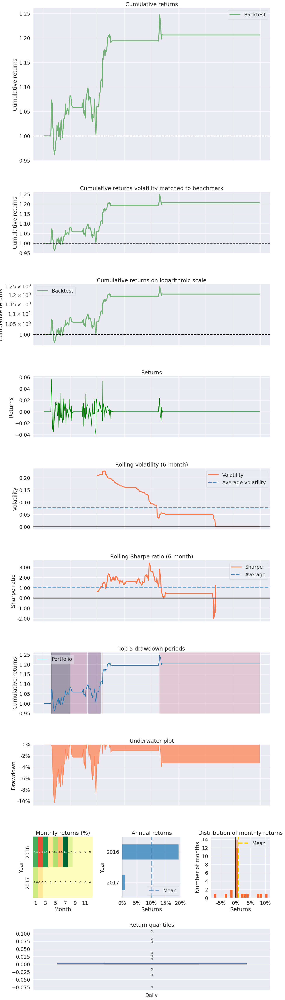

In [19]:
%matplotlib inline

from zipline import run_algorithm 
from zipline.api import order_target_percent, symbol, set_commission, set_slippage
from zipline.finance.commission import PerTrade
from zipline.finance.slippage import EquitySlippageModel, VolumeShareSlippage
import pandas as pd
import pyfolio as pf
from stockstats import StockDataFrame as sdf

import warnings
warnings.filterwarnings('ignore')

def initialize(context): 
    context.stock = symbol('MSFT')
    context.rolling_window = 20
    set_commission(PerTrade(cost=5))  
    set_slippage(VolumeShareSlippage(volume_limit=0.025, price_impact=0.1))

def handle_data(context, data): 
    price_hist = data.history(context.stock, ["open", "high", "low","close"], context.rolling_window, "1d")             
    
    stock=sdf.retype(price_hist)   

    rsi = stock.get('rsi_12')
       
    signal = stock['macds']
    macd   = stock['macd'] 
        
    if rsi[-1] < 50 and macd[-1] > signal[-1] and macd[-2] <= signal[-2]: #macd indicates crossover above signal and rsi indicates oversold, buy
        order_target_percent(context.stock, 1.0)     
    elif rsi[-1] > 50 and macd[-1] < signal[-1] and macd[-2] >= signal[-2]: #macd indicates crossover below signal and rsi indicates overought
        order_target_percent(context.stock, 0.0)   
        
def analyze(context, perf): 
    returns, positions, transactions = pf.utils.extract_rets_pos_txn_from_zipline(perf) 
    pf.create_returns_tear_sheet(returns, benchmark_rets = None)
    
# start_date = pd.to_datetime('2015-1-1', utc=True)
# end_date = pd.to_datetime('2018-1-1', utc=True)
start_date = pd.Timestamp('2016-1-1')
end_date = pd.Timestamp('2018-1-1')
    
results = run_algorithm(start = start_date, end = end_date, initialize = initialize, \
                        analyze = analyze, handle_data = handle_data, capital_base = 10000, \
                        data_frequency = 'daily', bundle ='quandl')

## Triple Exponential Average (TRIX) Strategy

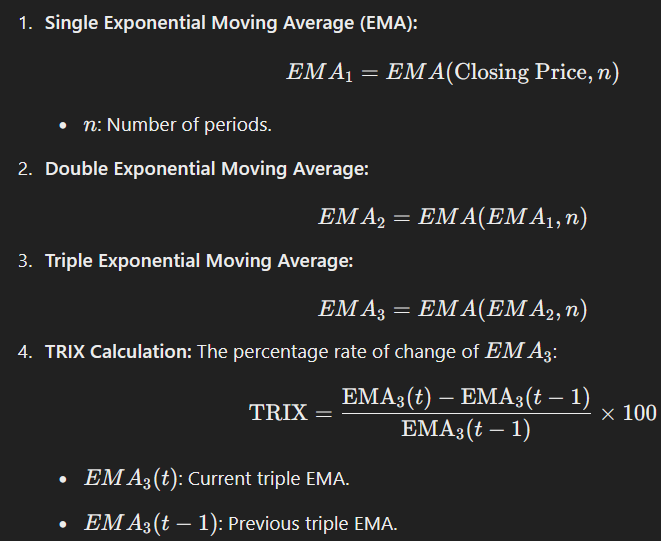

https://www.investopedia.com/articles/technical/02/092402.asp

Like many oscillators, TRIX oscillates around a zero line. When it is used as an oscillator, a positive value indicates an overbought market while a negative value indicates an oversold market.


Start date,2016-01-04
End date,2017-12-29
Total months,23
,Backtest
Annual return,7.3%
Cumulative returns,15.1%
Annual volatility,14.2%
Sharpe ratio,0.57
Calmar ratio,0.51
Stability,0.70
Max drawdown,-14.2%


Worst drawdown periods,Net drawdown in %,Peak date,Valley date,Recovery date,Duration
0,14.21,2016-04-18,2016-06-27,2017-10-05,384
1,10.54,2016-01-29,2016-02-09,2016-03-31,45
2,4.95,2016-01-14,2016-01-21,2016-01-29,12
3,2.27,2016-04-01,2016-04-11,2016-04-15,11
4,2.16,2016-01-12,2016-01-13,2016-01-14,3


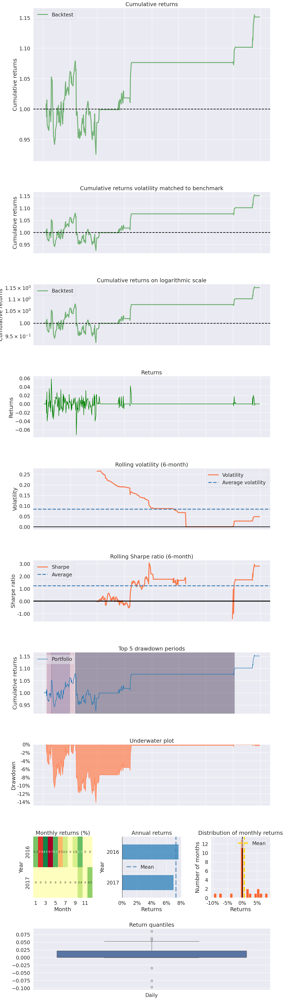

In [20]:
%matplotlib inline

from zipline import run_algorithm 
from zipline.api import order_target_percent, symbol, set_commission, set_slippage
from zipline.finance.commission import PerTrade
from zipline.finance.slippage import EquitySlippageModel, VolumeShareSlippage
import pandas as pd
import pyfolio as pf
from stockstats import StockDataFrame as sdf

import warnings
warnings.filterwarnings('ignore')

def initialize(context): 
    context.stock = symbol('MSFT')
    context.rolling_window = 20
    set_commission(PerTrade(cost=5))     
    set_slippage(VolumeShareSlippage(volume_limit=0.025, price_impact=0.1))

def handle_data(context, data): 
    price_hist = data.history(context.stock, ["open", "high", "low","close"], context.rolling_window, "1d")             
    
    stock=sdf.retype(price_hist)   

    trix = stock.get('trix') #It requires column and window. By default, the column is close price, the window is 12.
    
    if trix[-1] > 0 and trix[-2] < 0: #increasing trend from previous period and decreasing trend from period before
        order_target_percent(context.stock, 0.0)     
    elif trix[-1] < 0 and trix[-2] > 0: #decreasing trend from previous period and increasing trend from period before, expect uptick
        order_target_percent(context.stock, 1.0)   
        
def analyze(context, perf): 
    returns, positions, transactions = pf.utils.extract_rets_pos_txn_from_zipline(perf) 
    pf.create_returns_tear_sheet(returns, benchmark_rets = None)
    
# start_date = pd.to_datetime('2015-1-1', utc=True)
# end_date = pd.to_datetime('2018-1-1', utc=True)
start_date = pd.Timestamp('2016-1-1')
end_date = pd.Timestamp('2018-1-1')
    
results = run_algorithm(start = start_date, end = end_date, \
                        initialize = initialize, analyze = analyze, \
                        handle_data = handle_data, capital_base = 10000, \
                        data_frequency = 'daily', bundle ='quandl')

Was reading on another Oscillator called Stochastic RSI and saw below
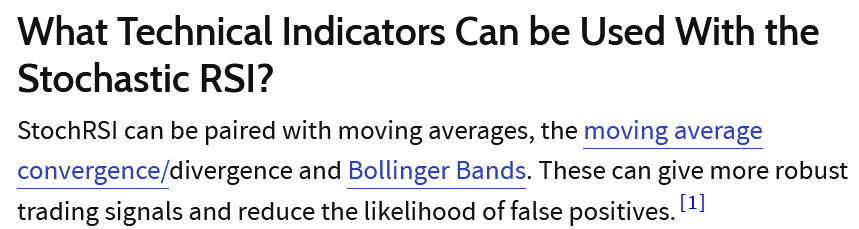

## Williams %R Strategy

https://www.investopedia.com/terms/w/williamsr.asp

The indicator tells a trader where the present price is relative to the highest high over the last 14 periods (or whatever number of periods going backward is chosen). 

A reading above -20 is overbought.
A reading below -80 is oversold.

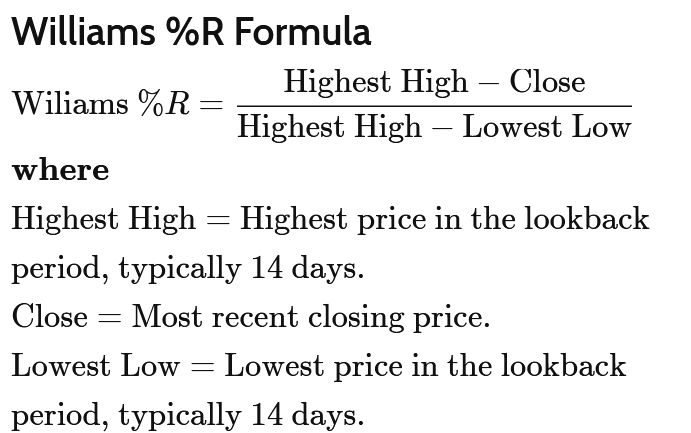

A very similar momentum indicator similar to Williams %R is Stochastic Oscillator (or Fast Stochastic Oscillator)
Slow Stochastic Oscillator is 3 Day moving average of %K

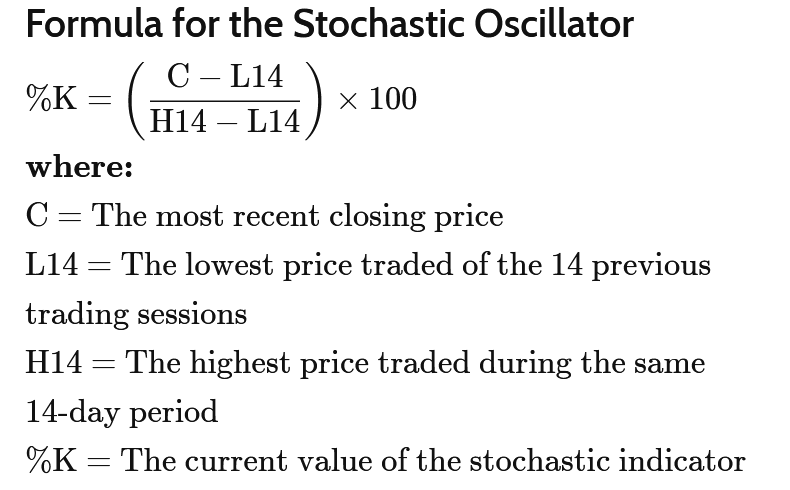

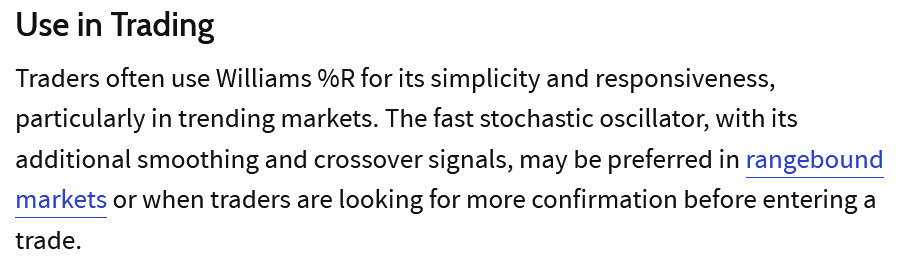

Start date,2016-01-04
End date,2017-12-29
Total months,23
,Backtest
Annual return,17.8%
Cumulative returns,38.6%
Annual volatility,10.6%
Sharpe ratio,1.60
Calmar ratio,3.33
Stability,0.96
Max drawdown,-5.3%


Worst drawdown periods,Net drawdown in %,Peak date,Valley date,Recovery date,Duration
0,5.33,2016-01-14,2016-02-09,2016-02-17,25
1,4.75,2016-04-13,2016-06-15,2016-06-29,56
2,2.53,2016-09-02,2016-09-09,2016-10-21,36
3,2.42,2017-06-27,2017-07-03,2017-07-10,10
4,2.15,2016-01-12,2016-01-13,2016-01-14,3


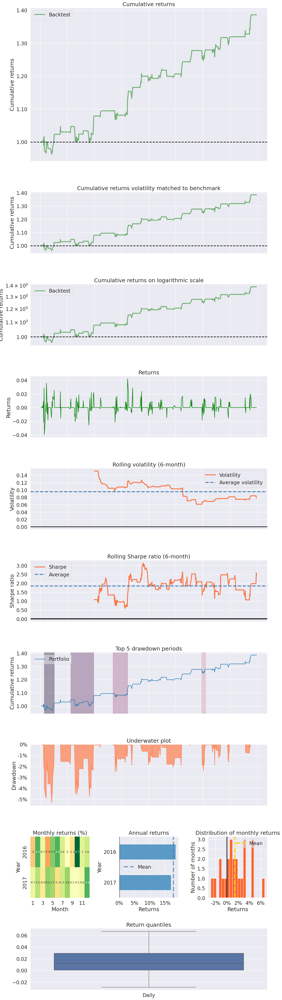

In [21]:
%matplotlib inline

from zipline import run_algorithm 
from zipline.api import order_target_percent, symbol, set_commission, set_slippage
from zipline.finance.commission import PerTrade
from zipline.finance.slippage import EquitySlippageModel, VolumeShareSlippage
import pandas as pd
import pyfolio as pf
from stockstats import StockDataFrame as sdf

import warnings
warnings.filterwarnings('ignore')

def initialize(context): 
    context.stock = symbol('MSFT')
    context.rolling_window = 20
    set_commission(PerTrade(cost=5))    
    set_slippage(VolumeShareSlippage(volume_limit=0.025, price_impact=0.1))

def handle_data(context, data): 
    price_hist = data.history(context.stock, ["open", "high", "low","close"], context.rolling_window, "1d")             
    
    stock=sdf.retype(price_hist)   

    wr = stock.get('wr_6') #The default window is 14.
    
    if wr[-1] > -20:
        order_target_percent(context.stock, 0.0)     
    elif wr[-1] < -80:
        order_target_percent(context.stock, 1.0)   
        
def analyze(context, perf): 
    returns, positions, transactions = pf.utils.extract_rets_pos_txn_from_zipline(perf) 
    pf.create_returns_tear_sheet(returns, benchmark_rets = None)
    
# start_date = pd.to_datetime('2015-1-1', utc=True)
# end_date = pd.to_datetime('2018-1-1', utc=True)
start_date = pd.Timestamp('2016-1-1')
end_date = pd.Timestamp('2018-1-1')
    
results = run_algorithm(start = start_date, end = end_date, initialize = initialize, \
                        analyze = analyze, handle_data = handle_data, capital_base = 10000, \
                        data_frequency = 'daily', bundle ='quandl')

# Mean Reversion Strategies

## Bollinger Band Trading Strategy

Start date,2016-01-04
End date,2017-12-29
Total months,23
,Backtest
Annual return,10.2%
Cumulative returns,21.5%
Annual volatility,17.5%
Sharpe ratio,0.65
Calmar ratio,0.37
Stability,0.08
Max drawdown,-27.3%


Worst drawdown periods,Net drawdown in %,Peak date,Valley date,Recovery date,Duration
0,27.31,2016-08-24,2016-10-05,2017-10-02,289
1,3.45,2016-01-11,2016-01-14,2016-01-22,10
2,3.30,2016-04-18,2016-04-28,2016-05-04,13
3,1.94,2016-05-09,2016-05-23,2016-05-24,12
4,1.63,2016-05-04,2016-05-05,2016-05-09,4


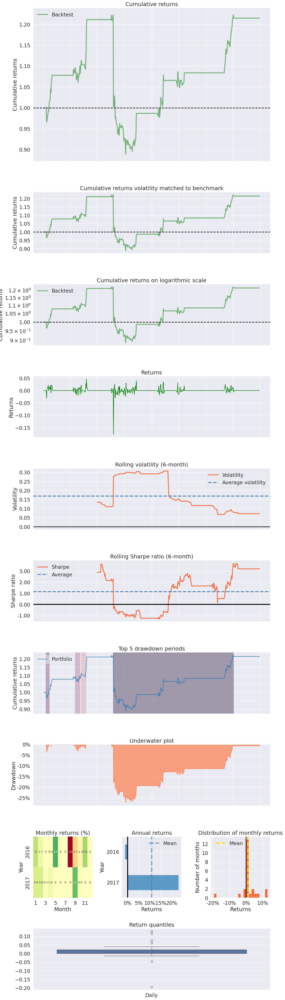

In [22]:
%matplotlib inline

from zipline import run_algorithm 
from zipline.api import order_target_percent, symbol, set_commission, set_slippage
from zipline.finance.commission import PerTrade
from zipline.finance.slippage import EquitySlippageModel, VolumeShareSlippage
import pandas as pd
import pyfolio as pf

import warnings
warnings.filterwarnings('ignore')

def initialize(context): 
    context.stock = symbol('DG')
    #Dollar General Corp
    context.rolling_window = 20 
    set_commission(PerTrade(cost=5))
    set_slippage(VolumeShareSlippage(volume_limit=0.025, price_impact=0.1))

def handle_data(context, data): 
    price_hist = data.history(context.stock, "close", context.rolling_window, "1d")          
    
    middle_base_line = price_hist.mean() #mean of all data upto that point
    std_line =  price_hist.std() #std of all data upto that point
    lower_band = middle_base_line - 2 * std_line
    upper_band = middle_base_line + 2 * std_line
   
    if price_hist[-1] < lower_band: 
        order_target_percent(context.stock, 1.0)     
    elif price_hist[-1] > upper_band:
        order_target_percent(context.stock, 0.0)     

def analyze(context, perf): 
    returns, positions, transactions = pf.utils.extract_rets_pos_txn_from_zipline(perf) 
    pf.create_returns_tear_sheet(returns, benchmark_rets = None)
    
# start_date = pd.to_datetime('2000-1-1', utc=True)
# end_date = pd.to_datetime('2018-1-1', utc=True)
start_date = pd.Timestamp('2016-1-1')
end_date = pd.Timestamp('2018-1-1')
    
results = run_algorithm(start = start_date, end = end_date, initialize = initialize, \
                        analyze = analyze, handle_data = handle_data, capital_base = 10000, \
                        data_frequency = 'daily', bundle ='quandl')

## Pairs-Trading Strategy

Start date,2016-01-04
End date,2017-12-29
Total months,23
,Backtest
Annual return,0.2%
Cumulative returns,0.4%
Annual volatility,4.2%
Sharpe ratio,0.07
Calmar ratio,0.03
Stability,0.24
Max drawdown,-6.9%


Worst drawdown periods,Net drawdown in %,Peak date,Valley date,Recovery date,Duration
0,6.92,2017-07-07,2017-11-14,NaT,NaN
1,0.70,2017-06-21,2017-06-26,2017-06-29,7
2,0.20,2017-07-03,2017-07-05,2017-07-06,4
3,0.10,2017-06-19,2017-06-20,2017-06-21,3
4,0.00,2016-01-04,2016-01-04,2016-01-04,1


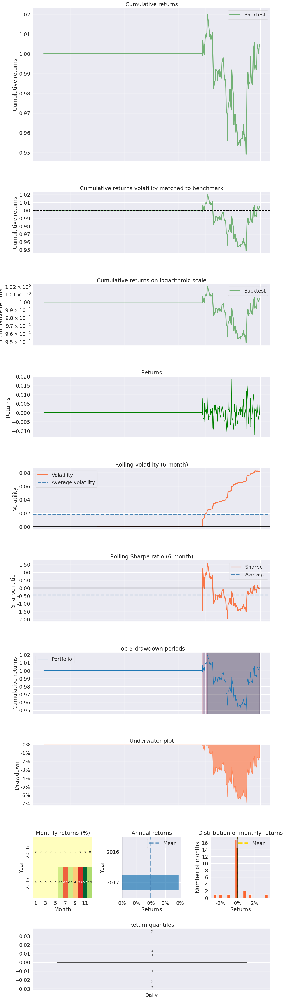

In [23]:
%matplotlib inline

from zipline import run_algorithm 
from zipline.api import order_target_percent, symbol, set_commission, set_slippage
from zipline.finance.commission import PerTrade
from zipline.finance.slippage import EquitySlippageModel, VolumeShareSlippage
import pandas as pd
import pyfolio as pf
import numpy as np
import statsmodels.api as sm
from statsmodels.tsa.stattools import coint


import warnings
warnings.filterwarnings('ignore')

def initialize(context): 
    context.stock_x = symbol('PEP') #pepsico
    context.stock_y = symbol('KO') #coca cola
    context.rolling_window = 100 
    set_commission(PerTrade(cost=5))     
    set_slippage(VolumeShareSlippage(volume_limit=0.025, price_impact=0.1))
    context.i = 0
    
def handle_data(context, data):   
    context.i += 1
    if context.i < context.rolling_window:
        return
    
    try:
        x_price = data.history(context.stock_x, "close", context.rolling_window, "1d")
        x = np.log(x_price)
        
        y_price = data.history(context.stock_y, "close", context.rolling_window, "1d")
        y = np.log(y_price)
        #print((x,y))

        _, p_value, _  = coint(x, y) #returns t-statistic, p_value, critical t-values for 1%,5%,10% p_values
        
        if p_value > .05:
            return
        
        #slope, intercept = sm.OLS(y, sm.add_constant(x, prepend=True)).fit().params
        intercept, slope = sm.OLS(y, sm.add_constant(x, prepend=True)).fit().params # y = intercept + slope*x
        
        spread = y - (slope * x + intercept)
        zscore = (spread[-1] - spread.mean()) / spread.std()    
        
        if -1 < zscore < 1:
            return

        side = np.copysign(0.5, zscore) 
        order_target_percent(context.stock_y, -side * 100 / y_price[-1])
        order_target_percent(context.stock_x,  side * slope * 100 / x_price[-1])    
    except:
        pass

def analyze(context, perf): 
    returns, positions, transactions = pf.utils.extract_rets_pos_txn_from_zipline(perf) 
    pf.create_returns_tear_sheet(returns, benchmark_rets = None)
    
# start_date = pd.to_datetime('2015-1-1', utc=True)
# end_date = pd.to_datetime('2018-01-01', utc=True)
start_date = pd.Timestamp('2016-1-1')
end_date = pd.Timestamp('2018-1-1')
    
results = run_algorithm(start = start_date, end = end_date, initialize = initialize, \
                        analyze = analyze, handle_data = handle_data, capital_base = 10000, \
                        data_frequency = 'daily', bundle ='quandl')


In [46]:
# import yfinance as yf
# # for symbol in ["PEP", "KO"]:
# data1 = yf.download("PEP", multi_level_index=False )
# data1 = data1.loc[(data1.index > '1999-01-01')& (data1.index < '2005-01-01')]

# data2 = yf.download("KO", multi_level_index=False )
# data2 = data2.loc[(data2.index > '1999-01-01')& (data2.index < '2005-01-01')]

# _, p_value, _  = coint(np.log(data1['Close']),np.log(data2['Close']))


# coint(data1['Close'],data2['Close']) 

# x, y = data1['Close'], data2['Close']
# intercept, slope = sm.OLS(y, sm.add_constant(x, prepend=True)).fit().params
        
# spread = y - (slope * x + intercept)
# zscore = (spread[-1] - spread.mean()) / spread.std()  
# zscore

# intercept, slope = sm.OLS(y, sm.add_constant(x, prepend=True)).fit().params
# intercept, slope

# Mathematical Model Based Strategies

## Minimization of Portfolio Volatility Strategy with Monthly Trading

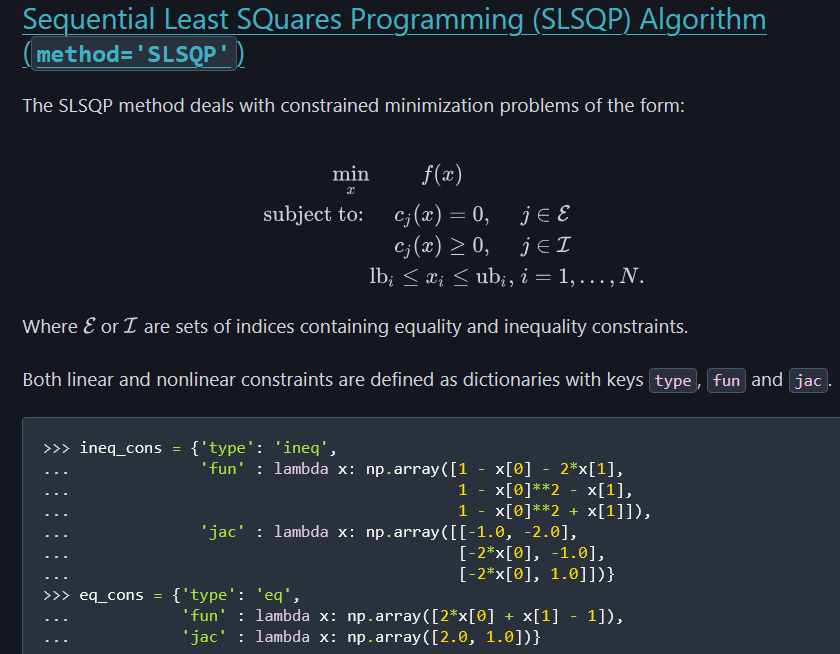

Start date,2016-01-04
End date,2017-12-29
Total months,23
,Backtest
Annual return,3.2%
Cumulative returns,6.4%
Annual volatility,2.3%
Sharpe ratio,1.36
Calmar ratio,1.71
Stability,0.17
Max drawdown,-1.9%


Worst drawdown periods,Net drawdown in %,Peak date,Valley date,Recovery date,Duration
0,1.86,2017-07-31,2017-08-18,2017-10-10,52
1,0.68,2017-10-26,2017-10-30,2017-11-03,7
2,0.65,2017-11-16,2017-11-20,2017-11-28,9
3,0.57,2017-12-04,2017-12-08,2017-12-13,8
4,0.57,2017-11-14,2017-11-15,2017-11-16,3


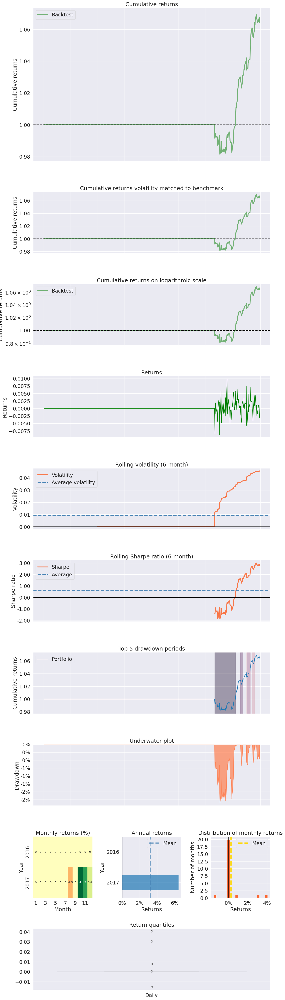

In [24]:
%matplotlib inline

from zipline import run_algorithm 
# from zipline.api import order_target_percent, symbol, set_commission, schedule_function, date_rules, time_rules
# from zipline.finance.commission import PerTrade
from zipline.api import order_target_percent, symbol, set_commission, set_slippage, schedule_function, date_rules, time_rules
from zipline.finance.commission import PerTrade
from zipline.finance.slippage import EquitySlippageModel, VolumeShareSlippage
import pandas as pd
import pyfolio as pf
from scipy.optimize import minimize
import numpy as np

import warnings
warnings.filterwarnings('ignore')

def initialize(context): 
    # the portfolio consists of all stocks in the Dow Jones Industrial
    # Average index.
    context.stocks = [symbol('DIS'),symbol('WMT'),symbol('DOW'),symbol('CRM'),
                      symbol('NKE'),symbol('HD'),symbol('V'),symbol('MSFT'),
                      symbol('MMM'),symbol('CSCO'),symbol('KO'),symbol('AAPL'),
                      symbol('HON'),symbol('JNJ'),symbol('TRV'),symbol('PG'),
                      symbol('CVX'),symbol('VZ'),symbol('CAT'),symbol('BA'),
                      symbol('AMGN'),symbol('IBM'),symbol('AXP'),symbol('JPM'),
                      symbol('WBA'),symbol('MCD'),symbol('MRK'),symbol('GS'),
                      symbol('UNH'),symbol('INTC')]    
    
    context.rolling_window = 200
    set_commission(PerTrade(cost=5))
    set_slippage(VolumeShareSlippage(volume_limit=0.025, price_impact=0.1))
    
    #The handle_data method will be called for every single month_end with the prices 1
    #hour after the market opens
    schedule_function(handle_data, date_rules.month_end(), time_rules.market_open(hours=1))
    
def minimum_vol_obj(wo, cov):
    w = wo.reshape(-1, 1)
    sig_p = np.sqrt(np.matmul(w.T, np.matmul(cov, w)))[0, 0]
    return sig_p

def handle_data(context, data): 
    n_stocks = len(context.stocks)
    prices = None
    
    for i in range(n_stocks):
        price_history = data.history(context.stocks[i], "close", context.rolling_window, "1d")
        
        price = np.array(price_history)
        if prices is None:
            prices = price
        else:
            prices = np.c_[prices, price] #concatinates prices column wise
    
    rets = prices[1:,:]/prices[0:-1, :]-1.0 #cool way for data manipulation or np.log(hist_data / hist_data.shift()) 
                                            #hist_return.cov()
    mu = np.mean(rets, axis=0)
    cov = np.cov(rets.T)    #check the dfinition of np.cov() to understand why we took rets.T
           
    w0 = np.ones(n_stocks) / n_stocks #initial equal weights
    
    #constraints and tolerance defined below, long only strategy as second constrain ensures weight are posititve
    cons = ({'type': 'eq', 'fun': lambda w: np.sum(w) - 1.0}, 
            {'type': 'ineq', 'fun': lambda w: w}
           )
    TOL = 1e-12    
    res = minimize(minimum_vol_obj, w0, args=cov, method='SLSQP', 
                   constraints=cons, tol=TOL, options={'disp': False})
    
    # SLSQP: Sequential Least Squares Programming algorithm
    # minimize(fun,x0,args=(),method=SLSQP,jac=None)
    # fun: The objective function to be minimized.
    # x0: Initial guess
    # args(): Extra arguments passed to the objective function and its derivatives (`fun`, `jac` and `hess` functions).
    # for SLSQP constraints are defined in a particular format , see documentation
    # disp : bool -> Set to True to print convergence messages.
    
    
    
    if not res.success:
        return;
    
    w = res.x #optimized weights
    
    for i in range(n_stocks):
        order_target_percent(context.stocks[i], w[i])    

def analyze(context, perf): 
    returns, positions, transactions = pf.utils.extract_rets_pos_txn_from_zipline(perf) 
    pf.create_returns_tear_sheet(returns, benchmark_rets = None)
    
# start_date = pd.to_datetime('2010-1-1', utc=True)
# end_date = pd.to_datetime('2018-1-1', utc=True)

start_date = pd.Timestamp('2016-1-1')
end_date = pd.Timestamp('2018-1-1')
    
results = run_algorithm(start = start_date, end = end_date, initialize = initialize, analyze = analyze, capital_base = 10000, data_frequency = 'daily', bundle ='quandl')

In [8]:
# minimize()

In [9]:
# a, b = np.random.randint(100, size=(3,5)), np.random.randint(100, size=(3,5))
# a, b

In [13]:
# np.r_[a, b]

In [10]:
# np.c_[a, b]

In [19]:
import yfinance as yf
stocks = ['DIS','WMT','CRM','NKE','HD','V','MSFT']
prices = None


for i in range(len(stocks)):
    price_history = yf.download(stocks[i],multi_level_index=False)
    price_history = price_history.loc[price_history.index > '2015-01-01']
    price = np.array(price_history['Close'])
    if prices is None:
        prices = price
    else:
        prices = np.c_[prices, price] #concatinates prices column wise

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


In [11]:
# rets = prices[1:,:]/prices[0:-1, :]-1.0 #cool way for data manipulation
# mu = np.mean(rets, axis=0)
# cov = np.cov(rets.T) 

In [12]:
# prices.shape, rets.shape, mu.shape, np.cov(rets.T).shape, np.cov(rets).shape

In [32]:
n_stocks = len(stocks)
w0 = np.ones(n_stocks) / n_stocks #initial equal weights
    
cons = ({'type': 'eq', 'fun': lambda w: np.sum(w) - 1.0}, {'type': 'ineq', 'fun': lambda w: w})
TOL = 1e-12    

In [34]:
cons

({'type': 'eq', 'fun': <function __main__.<lambda>(w)>},
 {'type': 'ineq', 'fun': <function __main__.<lambda>(w)>})

In [37]:
from scipy.optimize import minimize

def minimum_vol_obj(wo, cov):
    w = wo.reshape(-1, 1)
    sig_p = np.sqrt(np.matmul(w.T, np.matmul(cov, w)))[0, 0] #(wT)(sigma)(w)
    return sig_p

res = minimize(minimum_vol_obj, w0, args=cov, method='SLSQP', constraints=cons, tol=TOL, options={'disp': False})

In [38]:
res

 message: Optimization terminated successfully
 success: True
  status: 0
     fun: 0.010899921445186249
       x: [ 1.234e-01  4.817e-01  2.220e-03  5.515e-02  1.219e-01
            1.847e-01  3.095e-02]
     nit: 38
     jac: [ 1.090e-02  1.090e-02  1.090e-02  1.090e-02  1.090e-02
            1.090e-02  1.090e-02]
    nfev: 304
    njev: 38

In [45]:
res.x, 

array([0.12335048, 0.48166048, 0.00221993, 0.05514861, 0.12192965,
       0.18474356, 0.0309473 ])

In [46]:
w = w0.reshape(-1, 1)
w.shape, w0.shape, w.T

((7, 1),
 (7,),
 array([[0.14285714, 0.14285714, 0.14285714, 0.14285714, 0.14285714,
         0.14285714, 0.14285714]]))

In [44]:
np.matmul(w.T, np.matmul(cov, w))

array([[0.0001523]])

## Maximum Sharpe Ratio Strategy with Monthly Trading 

This strategy is based on ideas contained in Harry Markowitz's 1952 paper Portfolio
Selection. In brief, the best portfolios lie on the efficient frontier – a set of portfolios with
the highest expected portfolio return for each level of risk.
In this strategy, for the given stocks, we choose their weights so that they maximize the
portfolio's expected Sharpe ratio – such a portfolio lies on the efficient frontier.

Cannot place order for DOW, as it has de-listed. Any existing positions for this asset will be liquidated on 2017-09-01 00:00:00.
Cannot place order for DOW, as it has de-listed. Any existing positions for this asset will be liquidated on 2017-09-01 00:00:00.
Cannot place order for DOW, as it has de-listed. Any existing positions for this asset will be liquidated on 2017-09-01 00:00:00.
Cannot place order for DOW, as it has de-listed. Any existing positions for this asset will be liquidated on 2017-09-01 00:00:00.


Start date,2016-01-04
End date,2017-12-29
Total months,23
,Backtest
Annual return,2.2%
Cumulative returns,4.5%
Annual volatility,11.0%
Sharpe ratio,0.26
Calmar ratio,0.12
Stability,0.01
Max drawdown,-18.2%


Worst drawdown periods,Net drawdown in %,Peak date,Valley date,Recovery date,Duration
0,18.20,2016-04-19,2017-02-02,2017-11-21,416
1,8.77,2016-01-29,2016-02-08,2016-04-18,57
2,0.79,2017-11-30,2017-12-04,2017-12-08,7
3,0.55,2017-12-18,2017-12-22,2017-12-28,9
4,0.51,2017-12-28,2017-12-29,NaT,NaN


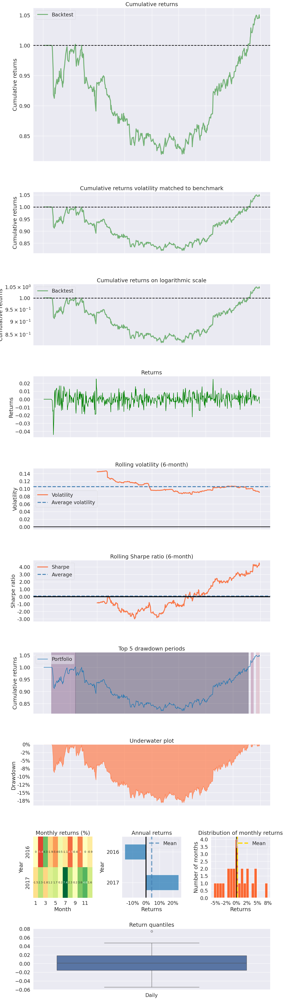

In [25]:
%matplotlib inline

from zipline import run_algorithm 
from zipline.api import order_target_percent, symbols, set_commission, set_slippage, schedule_function, date_rules, time_rules
from zipline.finance.commission import PerTrade
from zipline.finance.slippage import EquitySlippageModel, VolumeShareSlippage

import pandas as pd
import pyfolio as pf
import numpy as np
from pypfopt.efficient_frontier import EfficientFrontier
from pypfopt import risk_models
from pypfopt import expected_returns

import warnings
warnings.filterwarnings('ignore')
import numpy as np
np.NINF=  np.inf
pd.Series.iteritems = pd.Series.items

def initialize(context): 
    context.stocks = symbols('DIS','WMT','DOW','CRM','NKE','HD','V','MSFT','MMM','CSCO','KO','AAPL','HON','JNJ','TRV','PG','CVX','VZ','CAT','BA','AMGN','IBM','AXP','JPM','WBA','MCD','MRK','GS','UNH','INTC')
    context.rolling_window = 252 #1 trading year
    set_commission(PerTrade(cost=5))
    set_slippage(VolumeShareSlippage(volume_limit=0.025, price_impact=0.1))
    schedule_function(handle_data, date_rules.month_end(), time_rules.market_open(hours=1))
    
def handle_data(context, data): 
    prices_history = data.history(context.stocks, "close", context.rolling_window, "1d")
    avg_returns = expected_returns.mean_historical_return(prices_history)
    cov_mat = risk_models.sample_cov(prices_history)

    efficient_frontier = EfficientFrontier(avg_returns, cov_mat)
    weights = efficient_frontier.max_sharpe()
    cleaned_weights = efficient_frontier.clean_weights()
    
    for stock in context.stocks:
        order_target_percent(stock, cleaned_weights[stock])

def analyze(context, perf): 
    returns, positions, transactions = pf.utils.extract_rets_pos_txn_from_zipline(perf) 
    pf.create_returns_tear_sheet(returns, benchmark_rets = None)
    
# start_date = pd.to_datetime('2010-1-1', utc=True)
# end_date = pd.to_datetime('2018-1-1', utc=True)

start_date = pd.Timestamp('2016-1-1')
end_date = pd.Timestamp('2018-1-1')
    
results = run_algorithm(start = start_date, end = end_date, initialize = initialize, analyze = analyze, capital_base = 10000, data_frequency = 'daily', bundle ='quandl')

# Time Series Prediction Based Strategies

## SARIMAX Strategy

Start date,2016-01-04
End date,2017-12-29
Total months,23
,Backtest
Annual return,-2.1%
Cumulative returns,-4.2%
Annual volatility,9.9%
Sharpe ratio,-0.16
Calmar ratio,-0.15
Stability,0.01
Max drawdown,-14.0%


Worst drawdown periods,Net drawdown in %,Peak date,Valley date,Recovery date,Duration
0,14.02,2016-01-04,2016-12-12,2017-05-08,351
1,7.67,2017-05-12,2017-06-15,NaT,NaN
2,0.46,2017-05-09,2017-05-10,2017-05-12,4
3,0.00,2016-01-04,2016-01-04,2016-01-04,1
4,0.00,2016-01-04,2016-01-04,2016-01-04,1


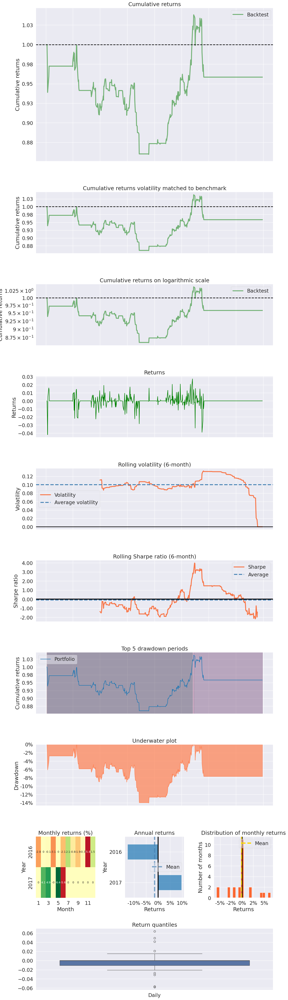

In [26]:
%matplotlib inline

from zipline import run_algorithm 
from zipline.api import order_target_percent, symbol, set_commission
from zipline.finance.commission import PerTrade
from zipline.api import order_target_percent, symbol, set_commission, set_slippage, schedule_function, date_rules, time_rules
from zipline.finance.commission import PerTrade
from zipline.finance.slippage import EquitySlippageModel, VolumeShareSlippage
import pandas as pd
import pyfolio as pf
import pmdarima as pm #similar to auto.arima in R

import warnings
warnings.filterwarnings('ignore')

def initialize(context): 
    context.stock = symbol('AAPL')
    context.rolling_window = 90
    set_commission(PerTrade(cost=5)) 
    set_slippage(VolumeShareSlippage(volume_limit=0.025, price_impact=0.1))


def handle_data(context, data): 
    price_hist = data.history(context.stock, "close", context.rolling_window, "1d")               
    try:
        model = pm.auto_arima(price_hist, seasonal=True)
        forecasts = model.predict(7)      
        order_target_percent(context.stock, 1.0 if price_hist[-1] < forecasts[-1] else 0.0) 
    except:
        pass

def analyze(context, perf): 
    returns, positions, transactions = pf.utils.extract_rets_pos_txn_from_zipline(perf) 
    pf.create_returns_tear_sheet(returns, benchmark_rets = None)
    
# start_date = pd.to_datetime('2017-1-1', utc=True)
# end_date = pd.to_datetime('2018-1-1', utc=True)

start_date = pd.Timestamp('2016-1-1')
end_date = pd.Timestamp('2018-1-1')

results = run_algorithm(start = start_date, end = end_date, initialize = initialize, analyze = analyze,
                        handle_data = handle_data, capital_base = 10000, 
                        data_frequency = 'daily', bundle ='quandl')

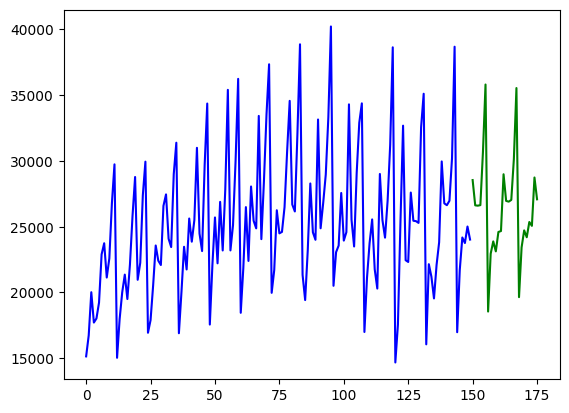

In [8]:
import pmdarima as pm
from pmdarima.model_selection import train_test_split
import numpy as np
import matplotlib.pyplot as plt

# Load/split your data
y = pm.datasets.load_wineind()
train, test = train_test_split(y, train_size=150)

# Fit your model
model = pm.auto_arima(train, seasonal=True, m=12)

# make your forecasts
forecasts = model.predict(test.shape[0])  # predict N steps into the future

# Visualize the forecasts (blue=train, green=forecasts)
x = np.arange(y.shape[0])
plt.plot(x[:150], train, c='blue')
plt.plot(x[150:], forecasts, c='green')
plt.show()

In [9]:
import numpy
print(numpy.__version__)

1.26.4


## Prophet Strategy

We only buy the stock if the last price is below the lower value of the confidence interval
(we anticipate that the stock price will go up) and sell the stock if the last price is above
the upper value of the predicted confidence interval (we anticipate that the stock price
will go down):

15:57:51 - cmdstanpy - INFO - Chain [1] start processing
15:57:52 - cmdstanpy - INFO - Chain [1] done processing
15:57:52 - cmdstanpy - INFO - Chain [1] start processing
15:57:53 - cmdstanpy - INFO - Chain [1] done processing
15:57:53 - cmdstanpy - INFO - Chain [1] start processing
15:57:53 - cmdstanpy - INFO - Chain [1] done processing
15:57:53 - cmdstanpy - INFO - Chain [1] start processing
15:57:54 - cmdstanpy - INFO - Chain [1] done processing
15:57:54 - cmdstanpy - INFO - Chain [1] start processing
15:57:55 - cmdstanpy - INFO - Chain [1] done processing
15:57:55 - cmdstanpy - INFO - Chain [1] start processing
15:57:55 - cmdstanpy - INFO - Chain [1] done processing
15:57:55 - cmdstanpy - INFO - Chain [1] start processing
15:57:56 - cmdstanpy - INFO - Chain [1] done processing
15:57:56 - cmdstanpy - INFO - Chain [1] start processing
15:57:56 - cmdstanpy - INFO - Chain [1] done processing
15:57:57 - cmdstanpy - INFO - Chain [1] start processing
15:57:57 - cmdstanpy - INFO - Chain [1]

15:58:37 - cmdstanpy - INFO - Chain [1] done processing
15:58:37 - cmdstanpy - INFO - Chain [1] start processing
15:58:38 - cmdstanpy - INFO - Chain [1] done processing
15:58:38 - cmdstanpy - INFO - Chain [1] start processing
15:58:38 - cmdstanpy - INFO - Chain [1] done processing
15:58:39 - cmdstanpy - INFO - Chain [1] start processing
15:58:39 - cmdstanpy - INFO - Chain [1] done processing
15:58:39 - cmdstanpy - INFO - Chain [1] start processing
15:58:40 - cmdstanpy - INFO - Chain [1] done processing
15:58:40 - cmdstanpy - INFO - Chain [1] start processing
15:58:41 - cmdstanpy - INFO - Chain [1] done processing
15:58:41 - cmdstanpy - INFO - Chain [1] start processing
15:58:41 - cmdstanpy - INFO - Chain [1] done processing
15:58:42 - cmdstanpy - INFO - Chain [1] start processing
15:58:42 - cmdstanpy - INFO - Chain [1] done processing
15:58:42 - cmdstanpy - INFO - Chain [1] start processing
15:58:43 - cmdstanpy - INFO - Chain [1] done processing
15:58:43 - cmdstanpy - INFO - Chain [1] 

15:59:26 - cmdstanpy - INFO - Chain [1] done processing
15:59:26 - cmdstanpy - INFO - Chain [1] start processing
15:59:26 - cmdstanpy - INFO - Chain [1] done processing
15:59:27 - cmdstanpy - INFO - Chain [1] start processing
15:59:27 - cmdstanpy - INFO - Chain [1] done processing
15:59:27 - cmdstanpy - INFO - Chain [1] start processing
15:59:28 - cmdstanpy - INFO - Chain [1] done processing
15:59:28 - cmdstanpy - INFO - Chain [1] start processing
15:59:28 - cmdstanpy - INFO - Chain [1] done processing
15:59:29 - cmdstanpy - INFO - Chain [1] start processing
15:59:29 - cmdstanpy - INFO - Chain [1] done processing
15:59:29 - cmdstanpy - INFO - Chain [1] start processing
15:59:30 - cmdstanpy - INFO - Chain [1] done processing
15:59:30 - cmdstanpy - INFO - Chain [1] start processing
15:59:30 - cmdstanpy - INFO - Chain [1] done processing
15:59:31 - cmdstanpy - INFO - Chain [1] start processing
15:59:31 - cmdstanpy - INFO - Chain [1] done processing
15:59:31 - cmdstanpy - INFO - Chain [1] 

16:00:26 - cmdstanpy - INFO - Chain [1] done processing
16:00:27 - cmdstanpy - INFO - Chain [1] start processing
16:00:28 - cmdstanpy - INFO - Chain [1] done processing
16:00:28 - cmdstanpy - INFO - Chain [1] start processing
16:00:29 - cmdstanpy - INFO - Chain [1] done processing
16:00:29 - cmdstanpy - INFO - Chain [1] start processing
16:00:30 - cmdstanpy - INFO - Chain [1] done processing
16:00:30 - cmdstanpy - INFO - Chain [1] start processing
16:00:31 - cmdstanpy - INFO - Chain [1] done processing
16:00:32 - cmdstanpy - INFO - Chain [1] start processing
16:00:33 - cmdstanpy - INFO - Chain [1] done processing
16:00:33 - cmdstanpy - INFO - Chain [1] start processing
16:00:34 - cmdstanpy - INFO - Chain [1] done processing
16:00:34 - cmdstanpy - INFO - Chain [1] start processing
16:00:35 - cmdstanpy - INFO - Chain [1] done processing
16:00:36 - cmdstanpy - INFO - Chain [1] start processing
16:00:37 - cmdstanpy - INFO - Chain [1] done processing
16:00:37 - cmdstanpy - INFO - Chain [1] 

16:02:03 - cmdstanpy - INFO - Chain [1] done processing
16:02:03 - cmdstanpy - INFO - Chain [1] start processing
16:02:04 - cmdstanpy - INFO - Chain [1] done processing
16:02:04 - cmdstanpy - INFO - Chain [1] start processing
16:02:05 - cmdstanpy - INFO - Chain [1] done processing
16:02:06 - cmdstanpy - INFO - Chain [1] start processing
16:02:07 - cmdstanpy - INFO - Chain [1] done processing
16:02:07 - cmdstanpy - INFO - Chain [1] start processing
16:02:08 - cmdstanpy - INFO - Chain [1] done processing
16:02:09 - cmdstanpy - INFO - Chain [1] start processing
16:02:10 - cmdstanpy - INFO - Chain [1] done processing
16:02:10 - cmdstanpy - INFO - Chain [1] start processing
16:02:11 - cmdstanpy - INFO - Chain [1] done processing
16:02:11 - cmdstanpy - INFO - Chain [1] start processing
16:02:12 - cmdstanpy - INFO - Chain [1] done processing
16:02:13 - cmdstanpy - INFO - Chain [1] start processing
16:02:13 - cmdstanpy - INFO - Chain [1] done processing
16:02:14 - cmdstanpy - INFO - Chain [1] 

16:03:43 - cmdstanpy - INFO - Chain [1] done processing
16:03:43 - cmdstanpy - INFO - Chain [1] start processing
16:03:44 - cmdstanpy - INFO - Chain [1] done processing
16:03:45 - cmdstanpy - INFO - Chain [1] start processing
16:03:45 - cmdstanpy - INFO - Chain [1] done processing
16:03:46 - cmdstanpy - INFO - Chain [1] start processing
16:03:47 - cmdstanpy - INFO - Chain [1] done processing
16:03:47 - cmdstanpy - INFO - Chain [1] start processing
16:03:48 - cmdstanpy - INFO - Chain [1] done processing
16:03:49 - cmdstanpy - INFO - Chain [1] start processing
16:03:49 - cmdstanpy - INFO - Chain [1] done processing
16:03:50 - cmdstanpy - INFO - Chain [1] start processing
16:03:51 - cmdstanpy - INFO - Chain [1] done processing
16:03:51 - cmdstanpy - INFO - Chain [1] start processing
16:03:52 - cmdstanpy - INFO - Chain [1] done processing
16:03:52 - cmdstanpy - INFO - Chain [1] start processing
16:03:53 - cmdstanpy - INFO - Chain [1] done processing
16:03:54 - cmdstanpy - INFO - Chain [1] 

16:05:20 - cmdstanpy - INFO - Chain [1] done processing
16:05:21 - cmdstanpy - INFO - Chain [1] start processing
16:05:22 - cmdstanpy - INFO - Chain [1] done processing
16:05:22 - cmdstanpy - INFO - Chain [1] start processing
16:05:24 - cmdstanpy - INFO - Chain [1] done processing
16:05:24 - cmdstanpy - INFO - Chain [1] start processing
16:05:25 - cmdstanpy - INFO - Chain [1] done processing
16:05:26 - cmdstanpy - INFO - Chain [1] start processing
16:05:27 - cmdstanpy - INFO - Chain [1] done processing
16:05:27 - cmdstanpy - INFO - Chain [1] start processing
16:05:28 - cmdstanpy - INFO - Chain [1] done processing
16:05:29 - cmdstanpy - INFO - Chain [1] start processing
16:05:30 - cmdstanpy - INFO - Chain [1] done processing
16:05:30 - cmdstanpy - INFO - Chain [1] start processing
16:05:31 - cmdstanpy - INFO - Chain [1] done processing
16:05:32 - cmdstanpy - INFO - Chain [1] start processing
16:05:33 - cmdstanpy - INFO - Chain [1] done processing
16:05:34 - cmdstanpy - INFO - Chain [1] 

Start date,2016-01-04
End date,2017-12-29
Total months,23
,Backtest
Annual return,4.0%
Cumulative returns,8.0%
Annual volatility,15.6%
Sharpe ratio,0.33
Calmar ratio,0.18
Stability,0.38
Max drawdown,-22.4%


Worst drawdown periods,Net drawdown in %,Peak date,Valley date,Recovery date,Duration
0,22.37,2016-04-14,2016-06-27,2017-03-16,241
1,8.67,2017-04-04,2017-06-16,2017-08-09,92
2,8.20,2017-09-01,2017-09-25,2017-10-30,42
3,3.58,2017-08-09,2017-08-10,2017-08-15,5
4,3.38,2017-11-24,2017-12-06,NaT,NaN


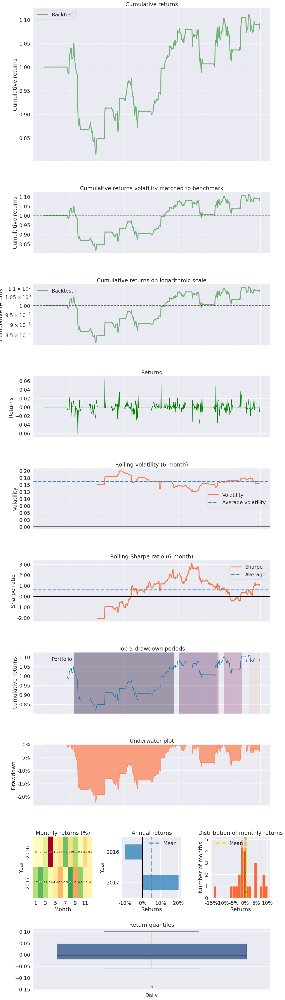

In [27]:
%matplotlib inline

from zipline import run_algorithm 
from zipline.api import order_target_percent, symbol, set_commission, set_slippage
from zipline.finance.commission import PerTrade
from zipline.finance.slippage import EquitySlippageModel, VolumeShareSlippage
import pandas as pd
import pyfolio as pf
# from fbprophet import Prophet
from prophet import Prophet
import logging
import pendulum
logging.getLogger('fbprophet').setLevel(logging.WARNING)

import warnings
warnings.filterwarnings('ignore')

def initialize(context): 
    context.stock = symbol('AAPL')
    context.rolling_window = 90
    
    set_commission(PerTrade(cost=5)) 
    set_slippage(VolumeShareSlippage(volume_limit=0.025, price_impact=0.1))
    


def handle_data(context, data): 
    price_hist = data.history(context.stock, "close", context.rolling_window, "1d")               
    
    price_df = pd.DataFrame({'y' : price_hist}).rename_axis('ds').reset_index()
    #price_df['ds'] = price_df['ds'].dt.tz_convert(None) #Convert tz-aware Datetime Array/Index 
                                                        #from one time zone to another.
    
        
    model = Prophet()
    model.fit(price_df)
    df_forecast = model.make_future_dataframe(periods=7, freq='D')
    df_forecast = model.predict(df_forecast)
    
    last_price = price_hist[-1]
    forecast_lower=df_forecast['yhat_lower'].iloc[-1]       
    forecast_upper=df_forecast['yhat_upper'].iloc[-1]
        
    if last_price < forecast_lower:
#     if last_price < 120:
        order_target_percent(context.stock, 1.0) 
    elif last_price > forecast_upper:
#     elif last_price >= 120:
        order_target_percent(context.stock, 0.0) 

def analyze(context, perf): 
    returns, positions, transactions = pf.utils.extract_rets_pos_txn_from_zipline(perf) 
    pf.create_returns_tear_sheet(returns, benchmark_rets = None)

# start_date = pd.to_datetime('2017-1-1')
# end_date = pd.to_datetime('2018-1-1')

start_date = pd.Timestamp('2016-1-1')
end_date = pd.Timestamp('2018-1-1')
    
results = run_algorithm(start = start_date, end = end_date,
                        initialize = initialize, analyze = analyze,
                        handle_data = handle_data, capital_base = 10000, 
                        data_frequency = 'daily', bundle ='quandl')